Task-1

Most Common Aggregate Rating: 0.0
Most Common Rating Range: 3-4

Distribution of Aggregate Ratings:
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: Aggregate rating, dtype: int64

Average Number of Votes Received by Restaurants: 156.909747670401


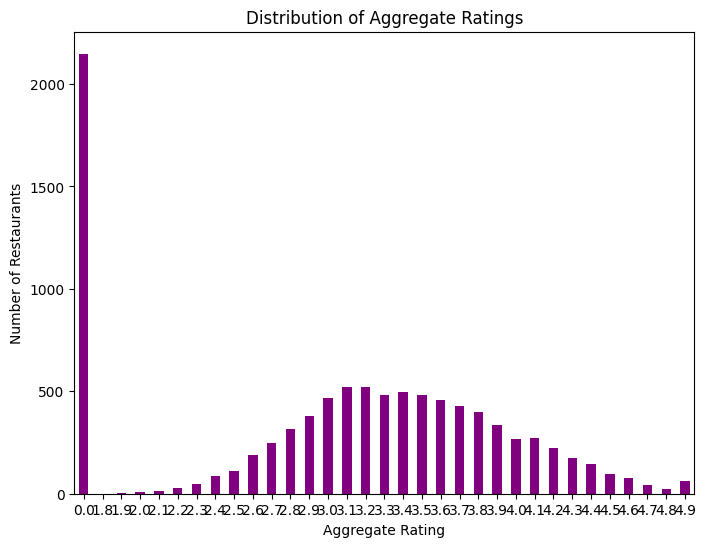

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("Dataset.csv")

# Analyze the distribution of aggregate ratings and determine the most common rating range
rating_counts = data['Aggregate rating'].value_counts().sort_index()
most_common_rating = rating_counts.idxmax()
rating_range_counts = {
    '0-1': rating_counts[(rating_counts.index >= 0) & (rating_counts.index <= 1)].sum(),
    '1-2': rating_counts[(rating_counts.index > 1) & (rating_counts.index <= 2)].sum(),
    '2-3': rating_counts[(rating_counts.index > 2) & (rating_counts.index <= 3)].sum(),
    '3-4': rating_counts[(rating_counts.index > 3) & (rating_counts.index <= 4)].sum(),
    '4-5': rating_counts[(rating_counts.index > 4) & (rating_counts.index <= 5)].sum()
}
most_common_rating_range = max(rating_range_counts, key=rating_range_counts.get)

# Calculate the average number of votes received by restaurants
average_votes = data['Votes'].mean()

# Print the results
print("Most Common Aggregate Rating:", most_common_rating)
print("Most Common Rating Range:", most_common_rating_range)
print("\nDistribution of Aggregate Ratings:")
print(rating_counts)
print("\nAverage Number of Votes Received by Restaurants:", average_votes)

# Create a bar chart to visualize the distribution of aggregate ratings
plt.figure(figsize=(8, 6))
rating_counts.plot(kind='bar', color='purple')
plt.xlabel('Aggregate Rating')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Aggregate Ratings')
plt.xticks(rotation=0)
plt.show()


Task-2

Top 10 Most Common Cuisine Combinations:
(North Indian)                      936
(Chinese, North Indian)             616
(North Indian, Mughlai)             395
(Fast Food)                         354
(Chinese)                           354
(Chinese, North Indian, Mughlai)    306
(Cafe)                              299
(Bakery)                            218
(Desserts, Bakery)                  182
(Chinese, Fast Food)                159
Name: Cuisines, dtype: int64

Top 10 Highest Rated Cuisine Combinations:
Cuisines
(Continental, Bakery, Italian)    4.9
(Indonesian, Sunda)               4.9
(World Cuisine)                   4.9
(European, Contemporary)          4.9
(Steak, Burger, Bar Food)         4.9
(Seafood, Hawaiian)               4.9
(Sandwich, American, BBQ)         4.9
(Sandwich, American, Tea)         4.9
(German, European)                4.9
(Deli, Italian)                   4.9
Name: Aggregate rating, dtype: float64


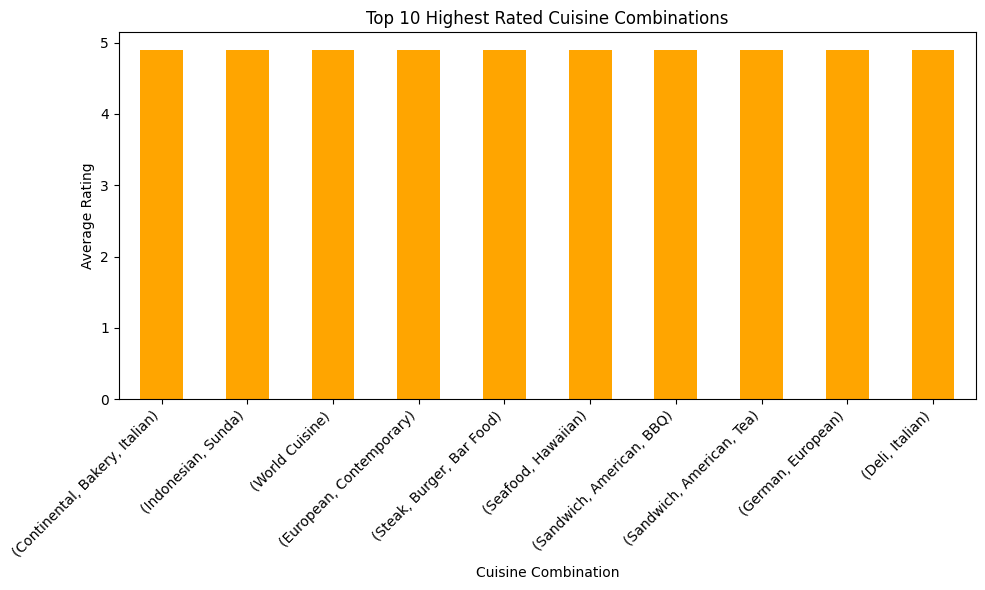

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("Dataset.csv")

# Drop rows with missing cuisine data
data = data.dropna(subset=['Cuisines'])

# Identify the most common combinations of cuisines
cuisine_combinations = data['Cuisines'].str.split(', ').apply(frozenset)
cuisine_combination_counts = cuisine_combinations.value_counts()

# Determine if certain cuisine combinations tend to have higher ratings
average_rating_per_combination = data.groupby(cuisine_combinations)['Aggregate rating'].mean()

# Print the top 10 most common cuisine combinations
print("Top 10 Most Common Cuisine Combinations:")
print(cuisine_combination_counts.head(10))

# Print the top 10 highest rated cuisine combinations
print("\nTop 10 Highest Rated Cuisine Combinations:")
print(average_rating_per_combination.nlargest(10))

# Create a bar chart to visualize the average ratings of cuisine combinations
plt.figure(figsize=(10, 6))
average_rating_per_combination.nlargest(10).plot(kind='bar', color='orange')
plt.xlabel('Cuisine Combination')
plt.ylabel('Average Rating')
plt.title('Top 10 Highest Rated Cuisine Combinations')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Task-3

In [4]:
pip install pandas matplotlib folium

In [5]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load the dataset
data = pd.read_csv("Dataset.csv")

# Create a map centered at a specific latitude and longitude
center_latitude = data['Latitude'].mean()
center_longitude = data['Longitude'].mean()
m = folium.Map(location=[center_latitude, center_longitude], zoom_start=12)

# Create a marker cluster to group nearby restaurant markers
marker_cluster = MarkerCluster().add_to(m)

# Add markers for each restaurant
for index, row in data.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(marker_cluster)

# Save the map as an HTML file
m.save("restaurant_map.html")

# Display the map in the notebook
m


Task-4

In [6]:
pip install pandas matplotlib


Top 10 Highest Rated Chains:
                           Average Rating
Talaga Sampireun                    4.900
AB's Absolute Barbecues             4.850
Silantro Fil-Mex                    4.850
AB's - Absolute Barbecues           4.825
Naturals Ice Cream                  4.800
Gymkhana                            4.700
The Cheesecake Factory              4.650
Dishoom                             4.600
Garota de Ipanema                   4.600
Chili's                             4.580

Top 10 Most Popular Chains:
                           Total Votes
Barbeque Nation                  28142
AB's - Absolute Barbecues        13400
Big Chill                        10853
Farzi Cafe                       10098
Truffles                          9682
Chili's                           8156
Joey's Pizza                      7807
Big Yellow Door                   7511
Saravana Bhavan                   7238
Starbucks                         7139


<Figure size 1200x600 with 0 Axes>

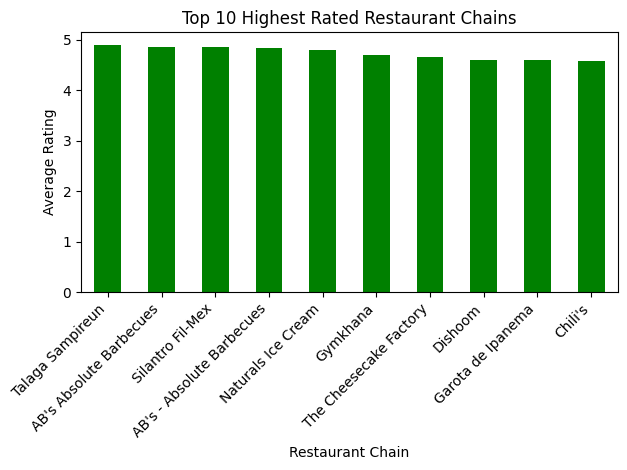

<Figure size 1200x600 with 0 Axes>

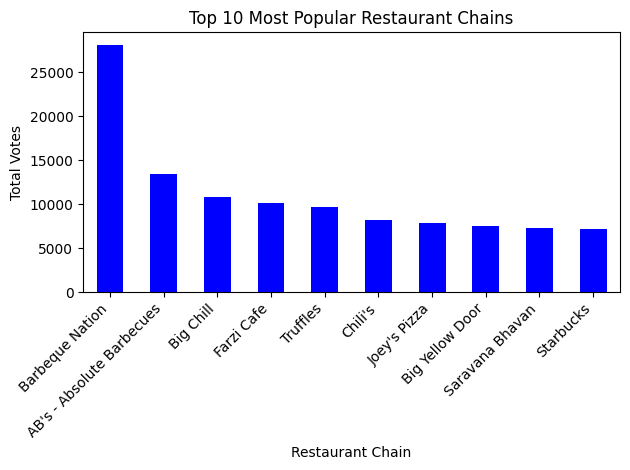

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("Dataset.csv")

# Identify restaurant chains by counting occurrences of restaurant names
restaurant_counts = data['Restaurant Name'].value_counts()
restaurant_chains = restaurant_counts[restaurant_counts > 1]

# Analyze the ratings and popularity of different restaurant chains
chain_ratings = {}
chain_popularity = {}

for chain_name, count in restaurant_chains.items():
    chain_data = data[data['Restaurant Name'] == chain_name]
    avg_rating = chain_data['Aggregate rating'].mean()
    total_votes = chain_data['Votes'].sum()
    chain_ratings[chain_name] = avg_rating
    chain_popularity[chain_name] = total_votes

# Convert the results into DataFrames for easier analysis
chain_ratings_df = pd.DataFrame.from_dict(chain_ratings, orient='index', columns=['Average Rating'])
chain_popularity_df = pd.DataFrame.from_dict(chain_popularity, orient='index', columns=['Total Votes'])

# Print the top 10 highest rated chains
print("Top 10 Highest Rated Chains:")
print(chain_ratings_df.nlargest(10, 'Average Rating'))

# Print the top 10 most popular chains
print("\nTop 10 Most Popular Chains:")
print(chain_popularity_df.nlargest(10, 'Total Votes'))

# Create bar charts to visualize the ratings and popularity of chains
plt.figure(figsize=(12, 6))
chain_ratings_df.nlargest(10, 'Average Rating').plot(kind='bar', color='green', legend=False)
plt.xlabel('Restaurant Chain')
plt.ylabel('Average Rating')
plt.title('Top 10 Highest Rated Restaurant Chains')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
chain_popularity_df.nlargest(10, 'Total Votes').plot(kind='bar', color='blue', legend=False)
plt.xlabel('Restaurant Chain')
plt.ylabel('Total Votes')
plt.title('Top 10 Most Popular Restaurant Chains')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()
